# Explaining Model Predictions in Python

[Matt Bezdek](mailto:matt.bezdek@elderresearch.com)

Senior Data Scientist

Elder Research

In this session we will walk through how calculating and visualizing model explanations can provide insights into why models generate the predictions they make. For these examples, we will use free datasets and Python libraries. To follow along, this notebook is available at:
# https://github.com/mattbezdek/model_explanations

## Load required package dependencies

In [ ]:
# !conda install lightgbm
# !pip install shap
# !conda install pytorch
# !pip install transformers
# !pip install matplotlib
# !pip install seaborn

In [183]:
import time
from datetime import datetime
from ast import literal_eval

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import lightgbm as lgb
from sklearn.model_selection import train_test_split
import shap
from transformers import AutoModelForSeq2SeqLM, AutoModelForCausalLM, AutoTokenizer

## Dataset from Kaggle box office prediction competition
https://www.kaggle.com/competitions/tmdb-box-office-prediction

These data come from a Kaggle competition to predict a movie's box office revenue from a set of features taken from a crowdsourcing movie website: themoviedb.org
To simplify this example, we will focus on a few specific features:

| feature | definition |
| -- | -- |
|budget| how much money ($) it cost to make |
|popularity | a measure of user engagement for the movie on the website|
| runtime | length of the movie in minutes|
| release_date| day the movie was released to theaters|
| genres | the relevant genres of the movie, can be more than one|

The data are split into a training set (with revenue included) and a test set for generating final predictions.


In [163]:
train = pd.read_csv("train.csv")
test = pd.read_csv("test.csv")

Let's engineer features for the year that each movie came out and the top genres. Here we take the last two digits of the release date and infer if it is a year from the 1900's or the 2000's.

In [164]:
train["release_year"] = train.apply(lambda x: x.release_date.split("/")[2], axis=1)
train["release_year"] = train.apply(
    lambda x: int("20" + str(x.release_year))
    if int(x.release_year) < 20
    else int("19" + str(x.release_year)),
    axis=1,
)
test = test.dropna(subset=["release_date"])
test["release_year"] = test.apply(lambda x: x.release_date.split("/")[2], axis=1)
test["release_year"] = test.apply(
    lambda x: int("20" + str(x.release_year))
    if int(x.release_year) < 20
    else int("19" + str(x.release_year)),
    axis=1,
)

There are many different genres for the movies in the dataset. For the sake of simplicity, we will limit our analysis to the top 5 most common genres in the dataset. We will create dummy variables to indicate the presence of each of the top genres: Drama, Comedy, Thriller, Action, and Romance.

In [243]:
genres = ["Drama", "Comedy", "Thriller", "Action", "Romance"]


def genre_parse(row, genre):
    present = 0
    try:
        for val in literal_eval(row.genres):
            if val["name"] == genre:
                present = 1
    except:
        pass
    return present


for g in genres:
    train[g] = train.apply(lambda x: genre_parse(x, g), axis=1)
    test[g] = test.apply(lambda x: genre_parse(x, g), axis=1)

In [289]:
train.head()

,id,belongs_to_collection,budget,genres,homepage,imdb_id,original_language,original_title,overview,popularity,...,Keywords,cast,crew,revenue,release_year,Drama,Comedy,Thriller,Action,Romance
0,1,"[{'id': 313576, 'name': 'Hot Tub Time Machine ...",14000000,"[{'id': 35, 'name': 'Comedy'}]",NaN,tt2637294,en,Hot Tub Time Machine 2,"When Lou, who has become the ""father of the In...",6.575393,...,"[{'id': 4379, 'name': 'time travel'}, {'id': 9...","[{'cast_id': 4, 'character': 'Lou', 'credit_id...","[{'credit_id': '59ac067c92514107af02c8c8', 'de...",12314651,2015,0,1,0,0,0
1,2,"[{'id': 107674, 'name': 'The Princess Diaries ...",40000000,"[{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...",NaN,tt0368933,en,The Princess Diaries 2: Royal Engagement,Mia Thermopolis is now a college graduate and ...,8.248895,...,"[{'id': 2505, 'name': 'coronation'}, {'id': 42...","[{'cast_id': 1, 'character': 'Mia Thermopolis'...","[{'credit_id': '52fe43fe9251416c7502563d', 'de...",95149435,2004,1,1,0,0,1
2,3,NaN,3300000,"[{'id': 18, 'name': 'Drama'}]",http://sonyclassics.com/whiplash/,tt2582802,en,Whiplash,"Under the direction of a ruthless instructor, ...",64.299990,...,"[{'id': 1416, 'name': 'jazz'}, {'id': 1523, 'n...","[{'cast_id': 5, 'character': 'Andrew Neimann',...","[{'credit_id': '54d5356ec3a3683ba0000039', 'de...",13092000,2014,1,0,0,0,0
3,4,NaN,1200000,"[{'id': 53, 'name': 'Thriller'}, {'id': 18, 'n...",http://kahaanithefilm.com/,tt1821480,hi,Kahaani,Vidya Bagchi (Vidya Balan) arrives in Kolkata ...,3.174936,...,"[{'id': 10092, 'name': 'mystery'}, {'id': 1054...","[{'cast_id': 1, 'character': 'Vidya Bagchi', '...","[{'credit_id': '52fe48779251416c9108d6eb', 'de...",16000000,2012,1,0,1,0,0
4,5,NaN,0,"[{'id': 28, 'name': 'Action'}, {'id': 53, 'nam...",NaN,tt1380152,ko,마린보이,Marine Boy is the story of a former national s...,1.148070,...,NaN,"[{'cast_id': 3, 'character': 'Chun-soo', 'cred...","[{'credit_id': '52fe464b9251416c75073b43', 'de...",3923970,2009,0,0,1,1,0


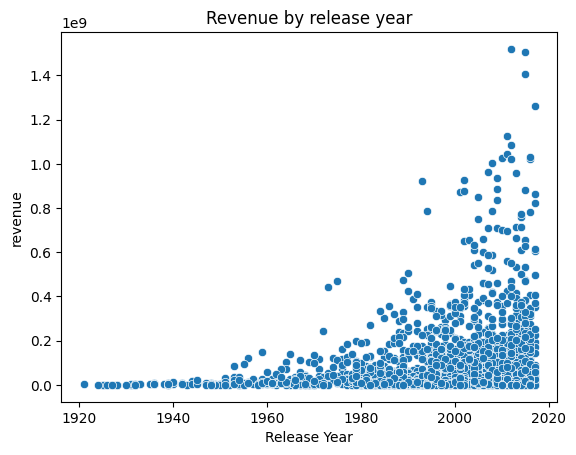

In [254]:
sns.scatterplot(data=train, x="release_year", y="revenue")
plt.xlabel("Release Year")
plt.title("Revenue by release year")
plt.show()

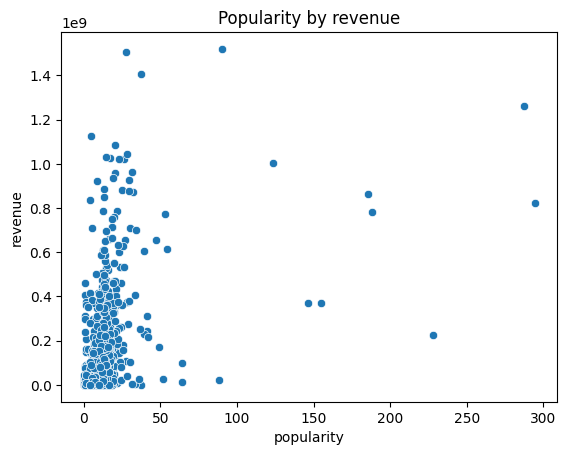

In [255]:
sns.scatterplot(data=train, x="popularity", y="revenue")
plt.title("Popularity by revenue")
plt.show()

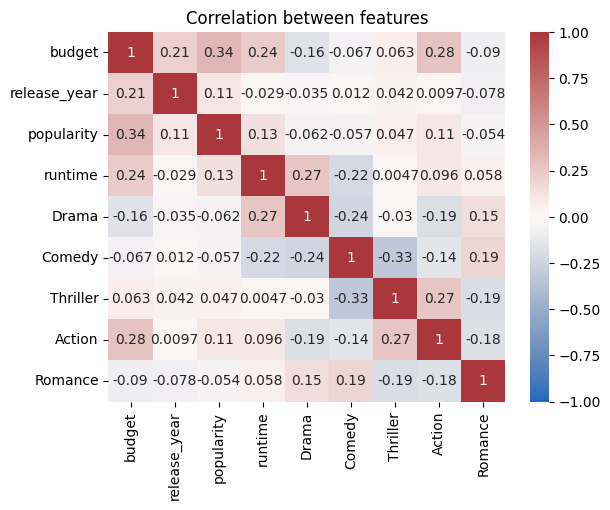

In [256]:
sns.heatmap(
    train[
        [
            "budget",
            "release_year",
            "popularity",
            "runtime",
            "Drama",
            "Comedy",
            "Thriller",
            "Action",
            "Romance",
        ]
    ].corr(),
    annot=True,
    cmap="vlag",
    vmin=-1,
    vmax=1,
)
plt.title("Correlation between features")
plt.show()

For this example, we will train a LightGBM model that uses gradient-boosted trees to predict box office revenue. 

In [199]:
X = train[
    [
        "budget",
        "popularity",
        "runtime",
        "release_year",
        "Drama",
        "Comedy",
        "Thriller",
        "Action",
        "Romance",
    ]
]
y = train["revenue"]
X_test = test[
    [
        "budget",
        "popularity",
        "runtime",
        "release_year",
        "Drama",
        "Comedy",
        "Thriller",
        "Action",
        "Romance",
    ]
]
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.1)

In [236]:
params = {
    "num_leaves": 20,
    "min_data_in_leaf": 20,
    "objective": "regression",
    "max_depth": 6,
    "learning_rate": 0.01,
    "boosting": "gbdt",
    "feature_fraction": 1.0,
    "bagging_freq": 10,
    "bagging_fraction": 0.75,
    "bagging_seed": 3,
    "metric": "rmse",
    "lambda_l1": 0.0,
    "verbosity": -1,
}
model = lgb.LGBMRegressor(**params, n_estimators=10000, nthread=4, n_jobs=-1)
model.fit(
    X_train,
    y_train,
    eval_set=[(X_train, y_train), (X_valid, y_valid)],
    eval_metric="rmse",
    callbacks=[lgb.early_stopping(stopping_rounds=200)],
)

Training until validation scores don't improve for 200 rounds
Early stopping, best iteration is:
[700]	training's rmse: 6.35767e+07	valid_1's rmse: 7.9741e+07


LGBMRegressor(bagging_fraction=0.75, bagging_freq=10, bagging_seed=3,
              boosting='gbdt', feature_fraction=1.0, lambda_l1=0.0,
              learning_rate=0.01, max_depth=6, metric='rmse',
              min_data_in_leaf=20, n_estimators=10000, n_jobs=-1, nthread=4,
              num_leaves=20, objective='regression', verbosity=-1)

LightGBM models have a built-in function for plotting the importance of each feature. This is a useful **global** measure to examine which features overall had the most influence on the model's predictions.

<Axes: title={'center': 'Feature importance'}, xlabel='Feature importance', ylabel='Features'>

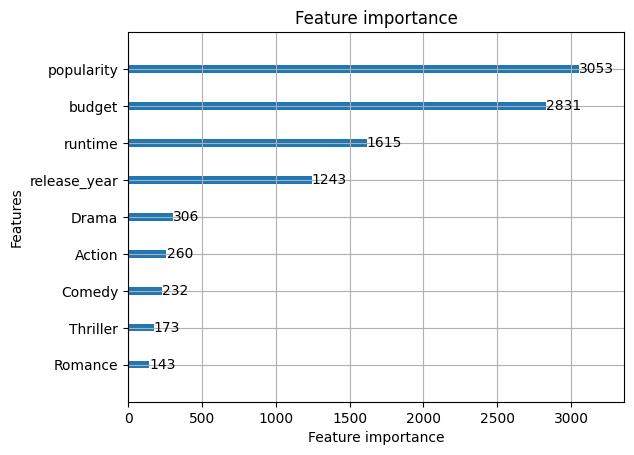

In [247]:
lgb.plot_importance(model)

## Calculate SHAP Values

SHAP values are based on game theory. The input features to the model can be thought of as players in a collaborative game, with the ultimate model output as the "payoff" for the game. SHAP values are a way to fairly assign credit based on how much each feature contributed to the final prediction. This is done through testing different coalitions of feature values and computing their marginal contribution.
Because they are model-agnostic, they can be flexibly applied to any model and can be calculated for multiple input types including tabular, text, and image data.

SHAP values produce a **local** explanation for a specific model prediction. They can be aggregated together to produce a **global** picture of how the model uses its features.

SHAP values are additive. Adding together the SHAP values across features will sum to the particular output, and features with no contribution will have SHAP values of 0.

In [271]:
explainer = shap.TreeExplainer(model, X_test)
shap_values = explainer(X_test)

 98%|===================| 4291/4397 [00:37<00:00]        

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


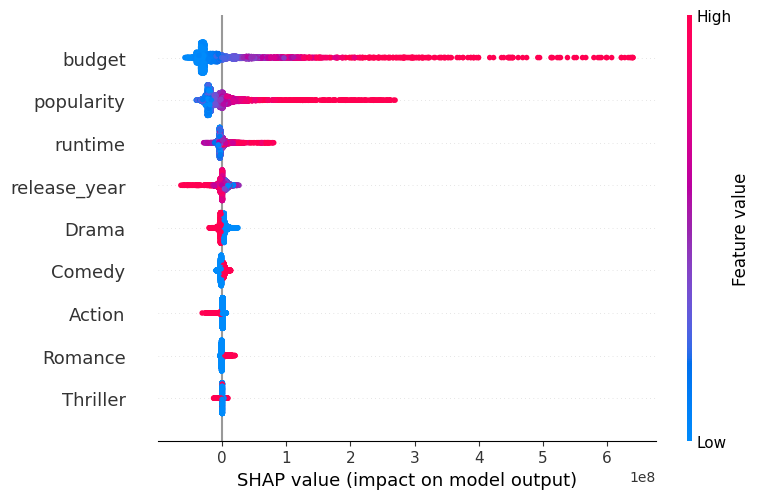

In [272]:
shap.summary_plot(shap_values)

In [281]:
test.iloc[19]

id                                                                    3020
belongs_to_collection                                                  NaN
budget                                                           200000000
genres                   [{'id': 18, 'name': 'Drama'}, {'id': 10749, 'n...
homepage                                       http://www.titanicmovie.com
imdb_id                                                          tt0120338
original_language                                                       en
original_title                                                     Titanic
overview                 84 years later, a 101-year-old woman named Ros...
popularity                                                        26.88907
poster_path                               /kHXEpyfl6zqn8a6YuozZUujufXf.jpg
production_companies     [{'name': 'Paramount Pictures', 'id': 4}, {'na...
production_countries     [{'iso_3166_1': 'US', 'name': 'United States o...
release_date             

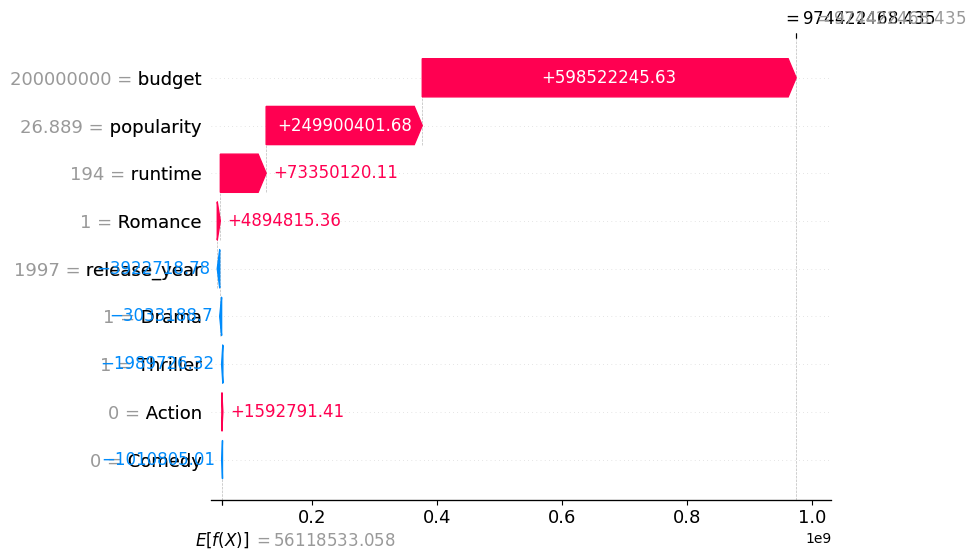

In [280]:
shap.plots.waterfall(shap_values[19])

In [204]:
shap.initjs()

In [282]:
shap.plots.force(shap_values[19])

In [141]:
shap.plots.force(shap_values)

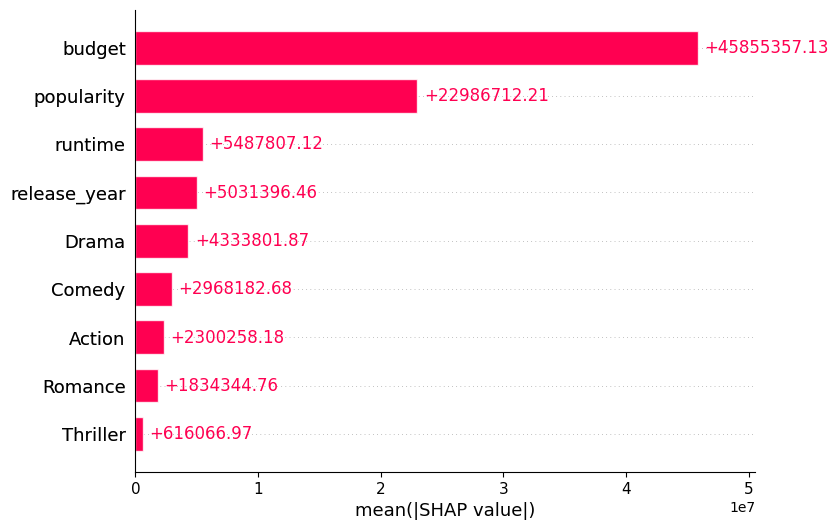

In [283]:
shap.plots.bar(shap_values)

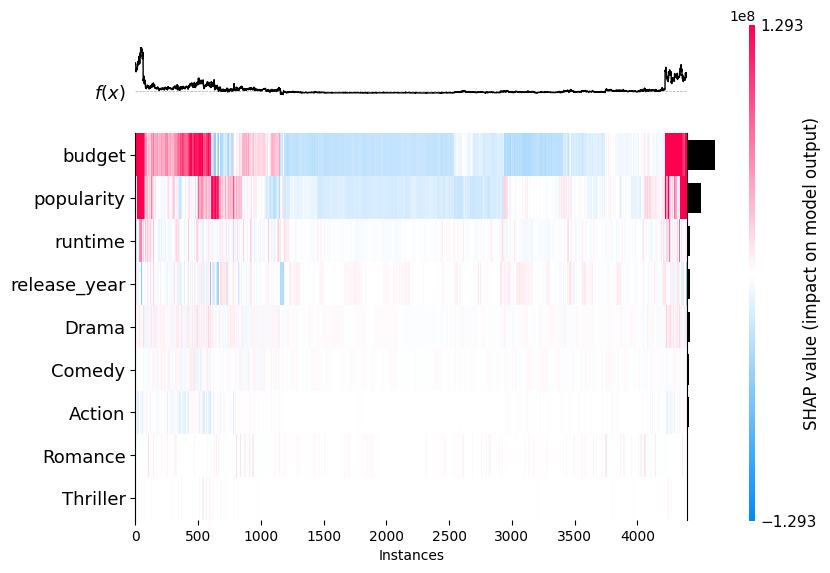

In [284]:
shap.plots.heatmap(shap_values)

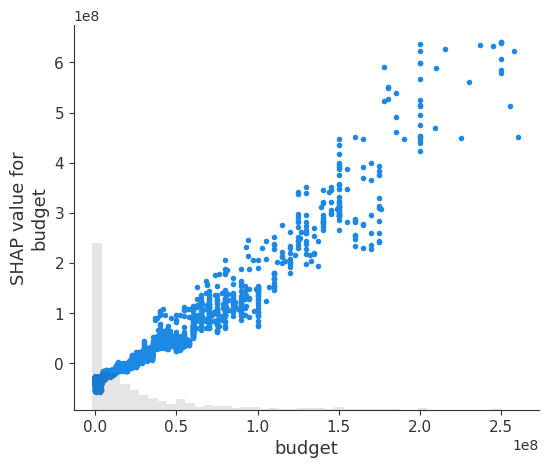

In [285]:
shap.plots.scatter(shap_values[:, "budget"])

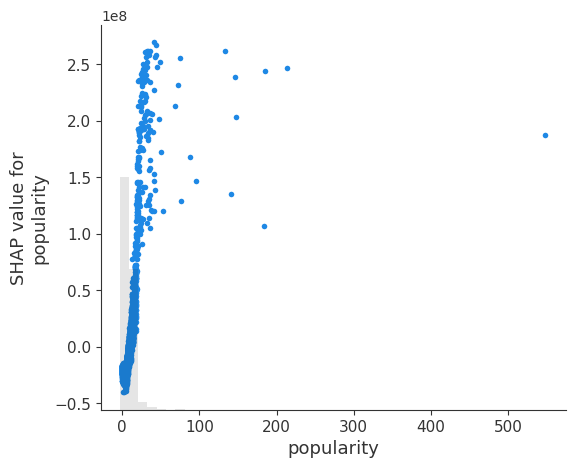

In [286]:
shap.plots.scatter(shap_values[:, "popularity"])

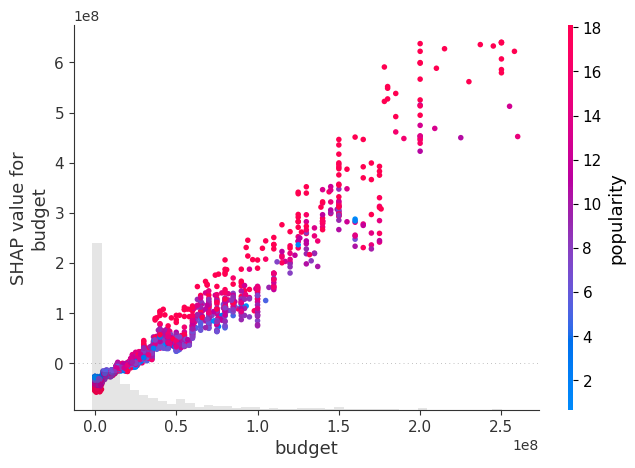

In [287]:
shap.plots.scatter(shap_values[:, 0], color=shap_values)

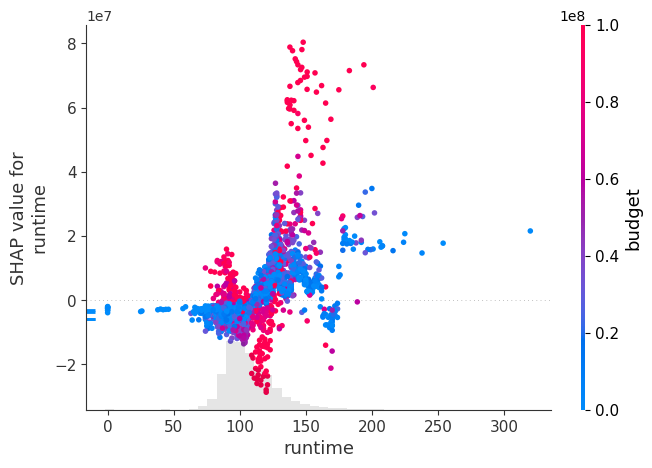

In [288]:
shap.plots.scatter(shap_values[:, 2], color=shap_values)

## Text summarization example

Beyond tabular data, SHAP values can also be created and visualized for models that use images or text as input. One popular language modeling task is summarization, in which a language model receives a text input and generates a new sequence of text to summarize the input. Here we use the distilbart extreme summarization model, trained on summaries of news stories. For this example, let's say that we want to write shorter summaries of the plot descriptions of the movies in the dataset. SHAP values allow us to see which parts of the input text are driving the selection of words for the output text.

In [16]:
tokenizer = AutoTokenizer.from_pretrained("sshleifer/distilbart-xsum-12-6")
text_model = AutoModelForSeq2SeqLM.from_pretrained("sshleifer/distilbart-xsum-12-6")

In [262]:
s = train["overview"].iloc[60:61]
s.tolist()

["Le Chiffre, a banker to the world's terrorists, is scheduled to participate in a high-stakes poker game in Montenegro, where he intends to use his winnings to establish his financial grip on the terrorist market. M sends Bond – on his maiden mission as a 00 Agent – to attend this game and prevent Le Chiffre from winning. With the help of Vesper Lynd and Felix Leiter, Bond enters the most important poker game in his already dangerous career."]

In [263]:
explainer = shap.Explainer(text_model, tokenizer)
text_shap_values = explainer(s)

Partition explainer: 2it [12:07, 727.24s/it]              


In [264]:
shap.plots.text(text_shap_values)

## Generative text model example

Another common usage for language models is to generate new text. Here we use OpenAI's GPT2 model to take the first few words of the plot description and generate predictive text for what could come next. Again, SHAP values will allow us to see how the parts of the input text are contributing to the generated outputs.

In [41]:
gen_tokenizer = AutoTokenizer.from_pretrained("gpt2", use_fast=True)
gen_model = AutoModelForCausalLM.from_pretrained("gpt2")

In [107]:
# set model decoder to true
gen_model.config.is_decoder = True
# set text-generation params under task_specific_params
gen_model.config.task_specific_params["text-generation"] = {
    "do_sample": True,
    "max_length": 50,
    "temperature": 0.7,
    "top_k": 70,
    "no_repeat_ngram_size": 2,
    "max_new_tokens": 30,
}

In [103]:
gen_s = pd.Series(train.tagline.iloc[60])

In [111]:
gen_s = pd.Series(" ".join(s.values[0].split(" ")[0:8]))
gen_s

0    Le Chiffre, a banker to the world's terrorists,
dtype: object

In [112]:
gen_explainer = shap.Explainer(gen_model, gen_tokenizer)
gen_shap_values = gen_explainer(gen_s)

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Partition explainer: 2it [01:25, 85.45s/it]               


In [113]:
shap.plots.text(gen_shap_values)